# Proyecto Integrador (TC5035)
# Identificación de Gestos en el Lenguaje de Manos Mexicano
---
## EQUIPO 51
- CARLOS MIGUEL ARVIZU DURÁN - A01410682
- YOHANNA CEBALLOS SALOMÓN - A01795115
- RUBÉN DÍAZ GARCÍA - A01371849

## Claustro de profesores
- PROFESOR ASESOR: DR. RAÚL VALENTE RAMÍREZ VELARDE
- PROFESORA TITULAR: DRA. GRETTEL BARCELÓ ALONSO
- PROFESOR TITULAR: DR. LUIS EDUARDO FALCÓN MORALES
- PROFESORA ASISTENTE: MTRA. VERÓNICA SANDRA GUZMÁN DE VALLE

In [ ]:
#!pip install -U pillow matplotlib numpy pandas scikit-learn imagehash tqdm
#!pip install --user ImageHash==4.3.2
#!pip install --user --upgrade tqdm

In [1]:
# ╔════════════════════════════════════════════════════════════╗
# ║  Imports y configuración general                           ║
# ║  Propósito: cargar librerías base y fijar semillas.        ║
# ╚════════════════════════════════════════════════════════════╝

import os, random
from pathlib import Path
from collections import defaultdict
import numpy as np
import pandas as pd
from PIL import Image, ImageOps, UnidentifiedImageError
import matplotlib.pyplot as plt
from tqdm import tqdm


# Intentar importar imagehash; marcar bandera si no está.
try:
    import imagehash
    _HAS_IMAGEHASH = True
except Exception:
    _HAS_IMAGEHASH = False

plt.rcParams['figure.dpi'] = 110

# Semillas para reproducibilidad en muestreos/plots
RNG_SEED = 42
random.seed(RNG_SEED)
np.random.seed(RNG_SEED)


In [2]:
# ╔════════════════════════════════════════════════════════════╗
# ║  Configuración de rutas y salidas                          ║
# ║  Propósito: apuntar a tus carpetas y definir OUT_DIR.      ║
# ╚════════════════════════════════════════════════════════════╝

# Carpeta base
BASE_DIR = Path(r"C:\Users\yohan\Pictures\LSM datasets\LSM Static - Zenodo\MSL-ABC").resolve()

# # Lista de datasets raíz a analizar
ROOTS = [
    BASE_DIR / "lsm-abc-A",
    BASE_DIR / "lsm-abc-B",
    BASE_DIR / "lsm-abc-C",
]

# Carpeta de salidas para CSVs/artefactos
OUT_DIR = BASE_DIR / "_eda_multi_outputs"
OUT_DIR.mkdir(parents=True, exist_ok=True)

BASE_DIR, ROOTS, OUT_DIR


(WindowsPath('C:/Users/yohan/Pictures/LSM datasets/LSM Static - Zenodo/MSL-ABC'),
 [WindowsPath('C:/Users/yohan/Pictures/LSM datasets/LSM Static - Zenodo/MSL-ABC/lsm-abc-A'),
  WindowsPath('C:/Users/yohan/Pictures/LSM datasets/LSM Static - Zenodo/MSL-ABC/lsm-abc-B'),
  WindowsPath('C:/Users/yohan/Pictures/LSM datasets/LSM Static - Zenodo/MSL-ABC/lsm-abc-C')],
 WindowsPath('C:/Users/yohan/Pictures/LSM datasets/LSM Static - Zenodo/MSL-ABC/_eda_multi_outputs'))

In [3]:
# ╔════════════════════════════════════════════════════════════╗
# ║  Recorrido de directorios → DataFrame consolidado          ║
# ║  Propósito: leer A/B/C, train/test y clases (A..Z).        ║
# ╚════════════════════════════════════════════════════════════╝

IMG_EXTS = {'.jpg', '.jpeg', '.png', '.bmp', '.gif', '.webp'}

def crawl_root(root: Path):
    # """Escanea una raíz con estructura root/{train,test}/{CLASE}/*.img"""
    rows = []
    dataset = root.name
    for split in ["train", "test"]:
        split_dir = root / split
        if not split_dir.exists():
            continue
        # labels son subcarpetas directas dentro de split
        for label_dir in sorted([p for p in split_dir.iterdir() if p.is_dir()]):
            label = label_dir.name
            for p in label_dir.rglob("*"):
                if p.suffix.lower() in IMG_EXTS and p.is_file():
                    rows.append({
                        "dataset": dataset,
                        "split": split,
                        "label": label,
                        "filepath": str(p.resolve())
                    })
    return pd.DataFrame(rows)

dfs = []
missing = []
for r in ROOTS:
    if r.exists():
        dfs.append(crawl_root(r))
    else:
        missing.append(str(r))

if missing:
    print("Advertencia: no existen estas raíces:", missing)

if not dfs:
    raise SystemExit("No se encontraron carpetas válidas en ROOTS.")

df = pd.concat(dfs, ignore_index=True).drop_duplicates(subset=["filepath"]).reset_index(drop=True)

print("Total filas (rutas únicas):", df.shape[0])
df.head(10)


Total filas (rutas únicas): 279716


,dataset,split,label,filepath
0,lsm-abc-A,train,A,C:\Users\yohan\Pictures\LSM datasets\LSM Stati...
1,lsm-abc-A,train,A,C:\Users\yohan\Pictures\LSM datasets\LSM Stati...
2,lsm-abc-A,train,A,C:\Users\yohan\Pictures\LSM datasets\LSM Stati...
3,lsm-abc-A,train,A,C:\Users\yohan\Pictures\LSM datasets\LSM Stati...
4,lsm-abc-A,train,A,C:\Users\yohan\Pictures\LSM datasets\LSM Stati...
5,lsm-abc-A,train,A,C:\Users\yohan\Pictures\LSM datasets\LSM Stati...
6,lsm-abc-A,train,A,C:\Users\yohan\Pictures\LSM datasets\LSM Stati...
7,lsm-abc-A,train,A,C:\Users\yohan\Pictures\LSM datasets\LSM Stati...
8,lsm-abc-A,train,A,C:\Users\yohan\Pictures\LSM datasets\LSM Stati...
9,lsm-abc-A,train,A,C:\Users\yohan\Pictures\LSM datasets\LSM Stati...


In [4]:
# ╔════════════════════════════════════════════════════════════╗
# ║  Integridad y metadatos de imágenes                        ║
# ║  Propósito: detectar corruptos y registrar tamaño, modo.   ║
# ╚════════════════════════════════════════════════════════════╝

def get_img_info(path):
    # """Devuelve dict con ok/width/height/mode/format/filesize/error."""
    info = {'ok': True, 'width': None, 'height': None, 'mode': None, 'format': None, 'filesize': None, 'error': None}
    try:
        with Image.open(path) as im:
            im = ImageOps.exif_transpose(im)
            info['width'], info['height'] = im.size
            info['mode'] = im.mode
            info['format'] = im.format
        info['filesize'] = os.path.getsize(path)
    except UnidentifiedImageError as e:
        info['ok'] = False
        info['error'] = f'UnidentifiedImageError: {e}'
    except Exception as e:
        info['ok'] = False
        info['error'] = str(e)
    return info

records = []
for p in tqdm(df['filepath'], desc="Revisando imágenes"):
    records.append(get_img_info(p))

meta = pd.DataFrame(records)
df_meta = pd.concat([df, meta], axis=1)
bad = df_meta[~df_meta['ok']]
print(f"Total: {len(df_meta)} | Corruptas/ilegibles: {len(bad)}")

# Guardar maestro con metadatos
master_csv = OUT_DIR / "master_multi.csv"
df_meta.to_csv(master_csv, index=False)
master_csv

Revisando imágenes: 100%|█████████████████████████████████████████████████████| 279716/279716 [08:21<00:00, 558.21it/s]


Total: 279716 | Corruptas/ilegibles: 0


WindowsPath('C:/Users/yohan/Pictures/LSM datasets/LSM Static - Zenodo/MSL-ABC/_eda_multi_outputs/master_multi.csv')

,dataset,split,label,count
0,lsm-abc-A,test,A,435
1,lsm-abc-A,test,B,441
2,lsm-abc-A,test,C,438
3,lsm-abc-A,test,D,453
4,lsm-abc-A,test,E,471
5,lsm-abc-A,test,F,456
6,lsm-abc-A,test,G,441
7,lsm-abc-A,test,H,441
8,lsm-abc-A,test,I,447
9,lsm-abc-A,test,L,486


label               A     B     C     D     E     F     G     H     I     L  \
dataset   split                                                               
lsm-abc-A test    435   441   438   453   471   456   441   441   447   486   
          train  4042  4091  3927  3950  4002  4013  3917  3749  4094  3971   
lsm-abc-B test    515   497   412   473   457   472   353   392   414   410   
          train  4447  4319  4070  4228  4246  4130  3993  3538  4174  4073   
lsm-abc-C test    473   400   450   480   439   467   435   467   474   465   
          train  3986  4008  4104  4049  4138  4099  4067  3882  4077  4052   

label            ...     N     O     P     R     S     T     U     V     W  \
dataset   split  ...                                                         
lsm-abc-A test   ...   455   459   444   438   435   438   444   450   441   
          train  ...  3733  3914  3944  4010  3999  4059  3945  4003  3960   
lsm-abc-B test   ...   400   485   406   442   397   428   374   361   388   
          train  ...  3404  3911  3964  4030  3846  4173  4027  3850  3944   
lsm-abc-C test   ...   437   447   450   423   441   435   423   443   459   
          train  ...  3857  4065  4074  4091  4060  4048  3947  3969  4016   

label               Y  
dataset   split        
lsm-abc-A test    471  
          train  3869  
lsm-abc-B test    361  
          train  3849  
lsm-abc-C test    434  
          train  4162  

[6 rows x 21 columns]

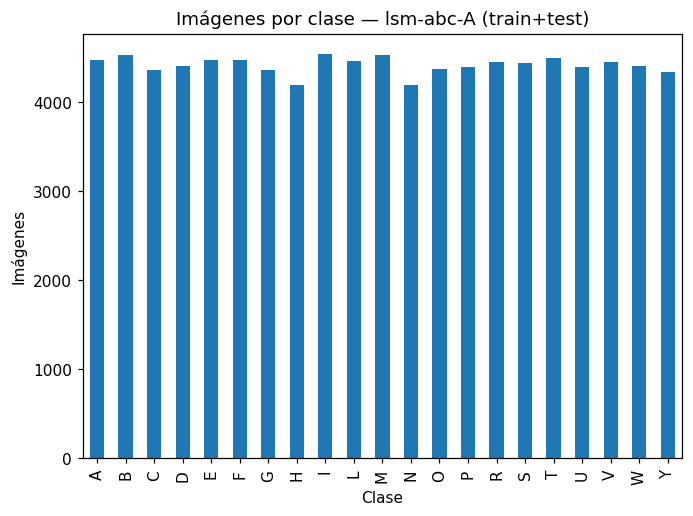

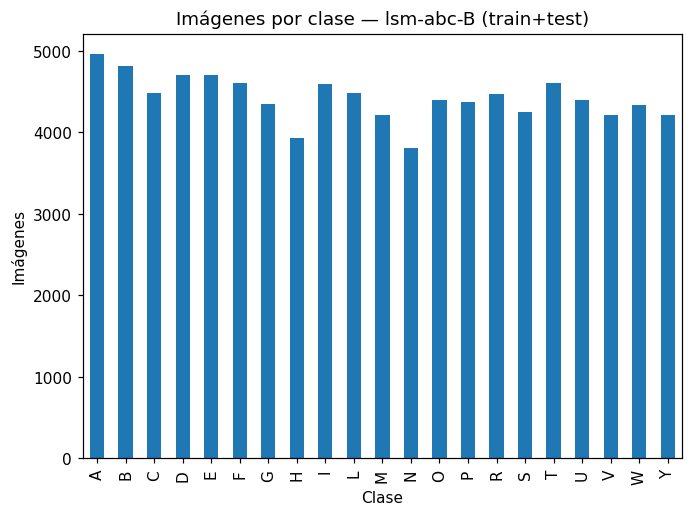

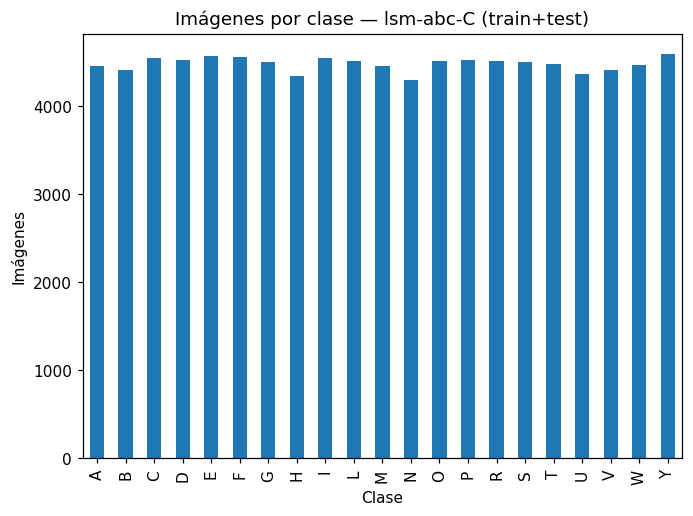

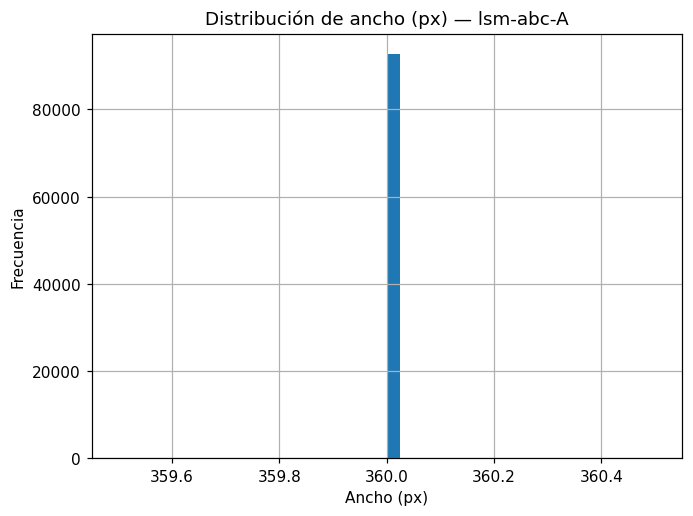

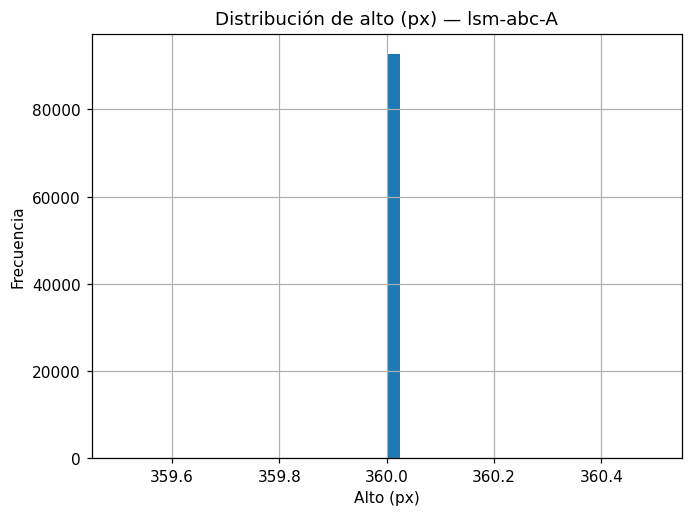

...

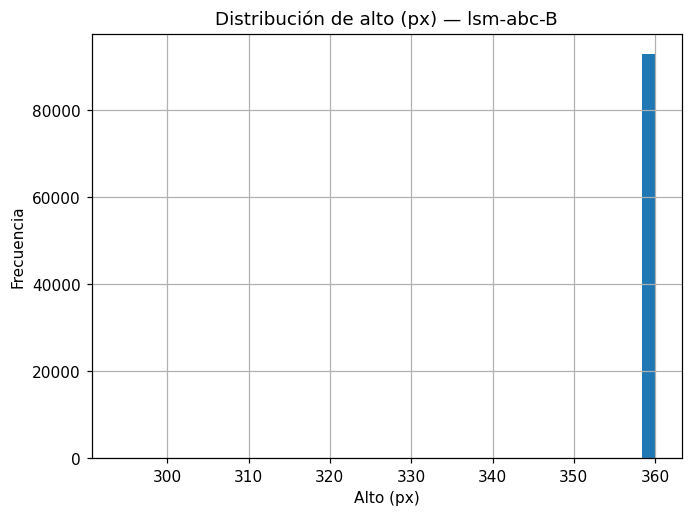

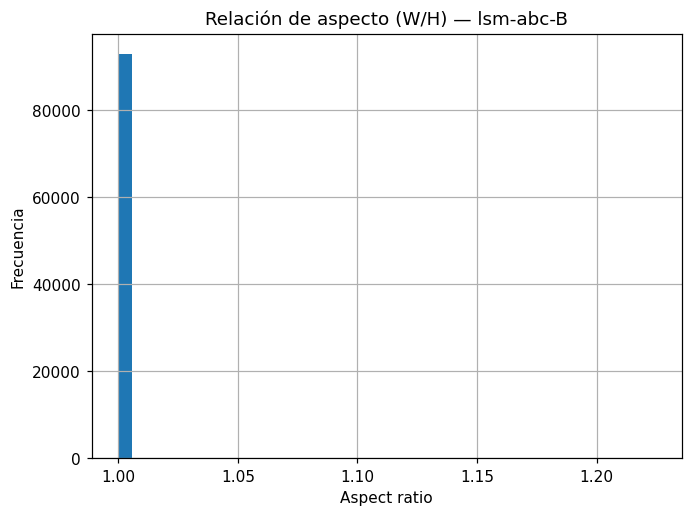

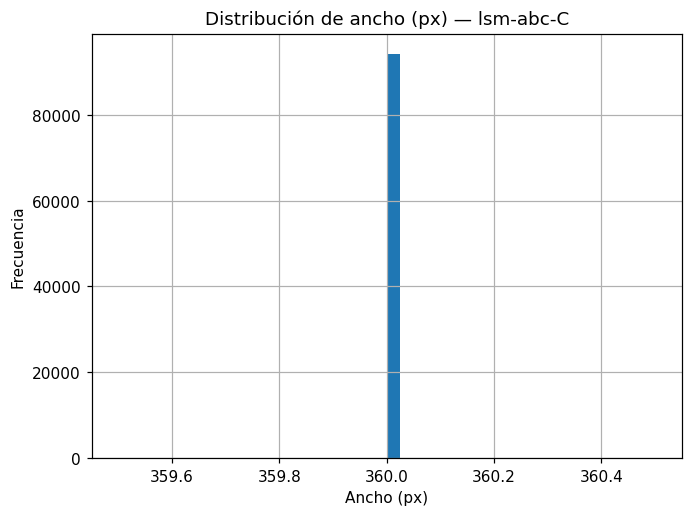

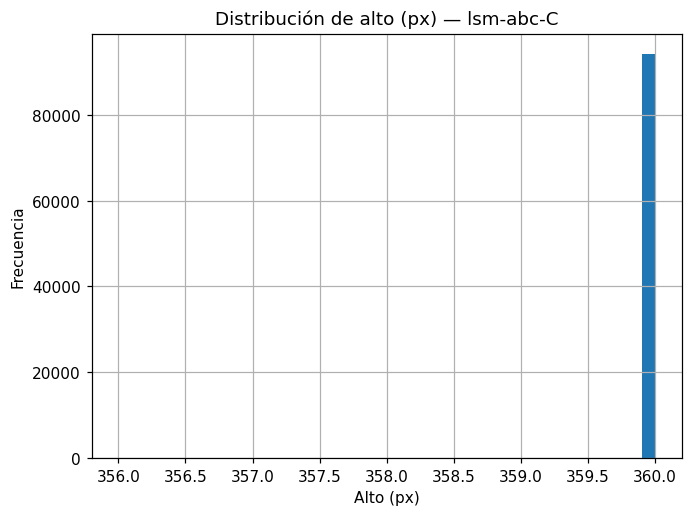

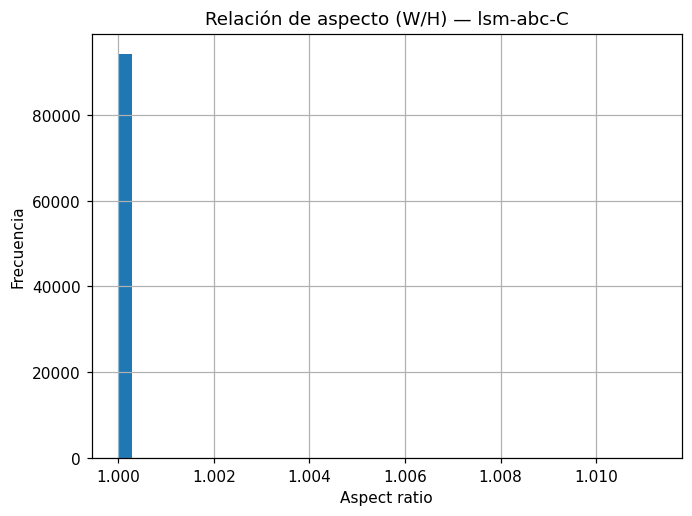

In [5]:
# ╔════════════════════════════════════════════════════════════╗
# ║  Estadísticas y distribuciones                             ║
# ║  Propósito: conteos por clase y formas (width/height/aspect)║
# ╚════════════════════════════════════════════════════════════╝

# Estadísticas por dataset y split
ok_df = df_meta[df_meta['ok']].copy()
ok_df['aspect'] = ok_df['width'] / ok_df['height']

# Conteos por dataset/split/label
counts = (ok_df.groupby(['dataset','split','label'])['filepath']
          .count().rename('count').reset_index())
display(counts.head(20))

# Tabla pivote (filas=dataset+split, columnas=clase)
counts_pivot = counts.pivot_table(index=['dataset','split'], columns='label', values='count', fill_value=0)
display(counts_pivot.head(10))

# Barras por dataset (todas las clases)
for d in sorted(ok_df['dataset'].unique()):
    plt.figure()
    ok_df[ok_df['dataset']==d]['label'].value_counts().sort_index().plot(kind='bar')
    plt.title(f"Imágenes por clase — {d} (train+test)")
    plt.xlabel("Clase")
    plt.ylabel("Imágenes")
    plt.tight_layout()
    plt.show()

# Histogramas de tamaños y aspect ratio por dataset
for d in sorted(ok_df['dataset'].unique()):
    sub = ok_df[ok_df['dataset']==d]
    plt.figure()
    sub['width'].hist(bins=40)
    plt.title(f"Distribución de ancho (px) — {d}")
    plt.xlabel("Ancho (px)")
    plt.ylabel("Frecuencia")
    plt.tight_layout()
    plt.show()

    plt.figure()
    sub['height'].hist(bins=40)
    plt.title(f"Distribución de alto (px) — {d}")
    plt.xlabel("Alto (px)")
    plt.ylabel("Frecuencia")
    plt.tight_layout()
    plt.show()

    plt.figure()
    sub['aspect'].hist(bins=40)
    plt.title(f"Relación de aspecto (W/H) — {d}")
    plt.xlabel("Aspect ratio")
    plt.ylabel("Frecuencia")
    plt.tight_layout()
    plt.show()


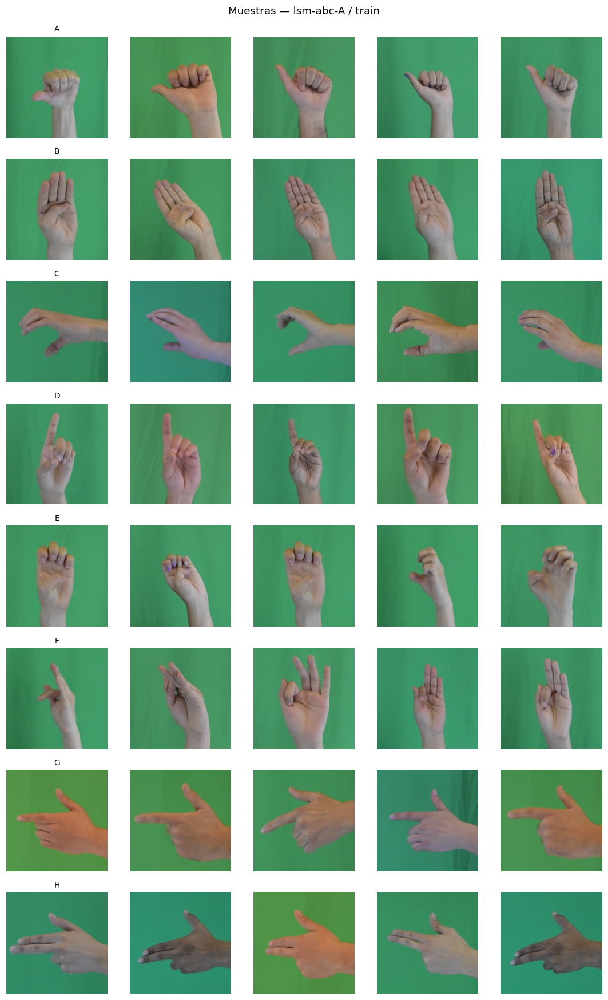

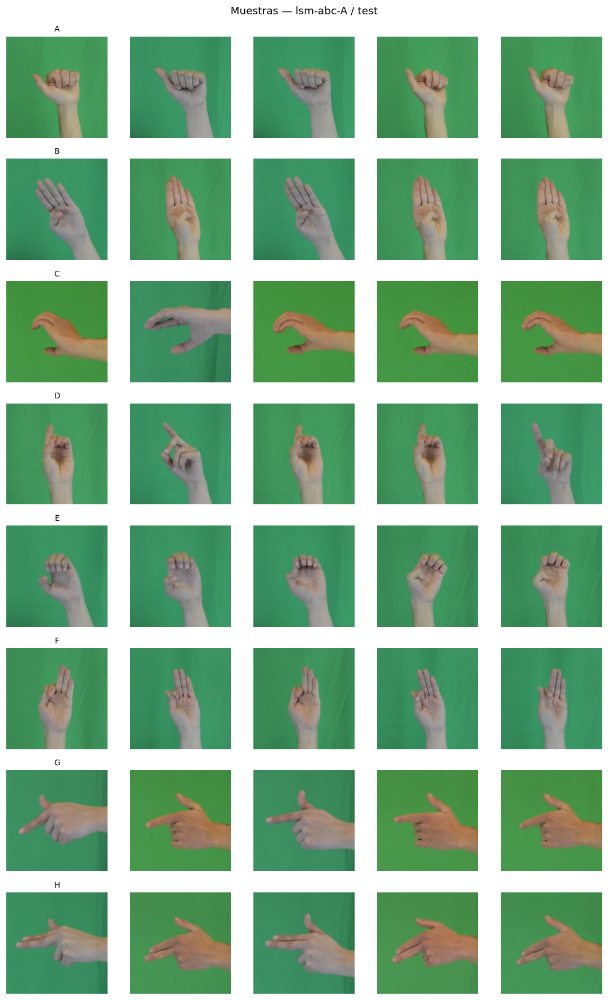

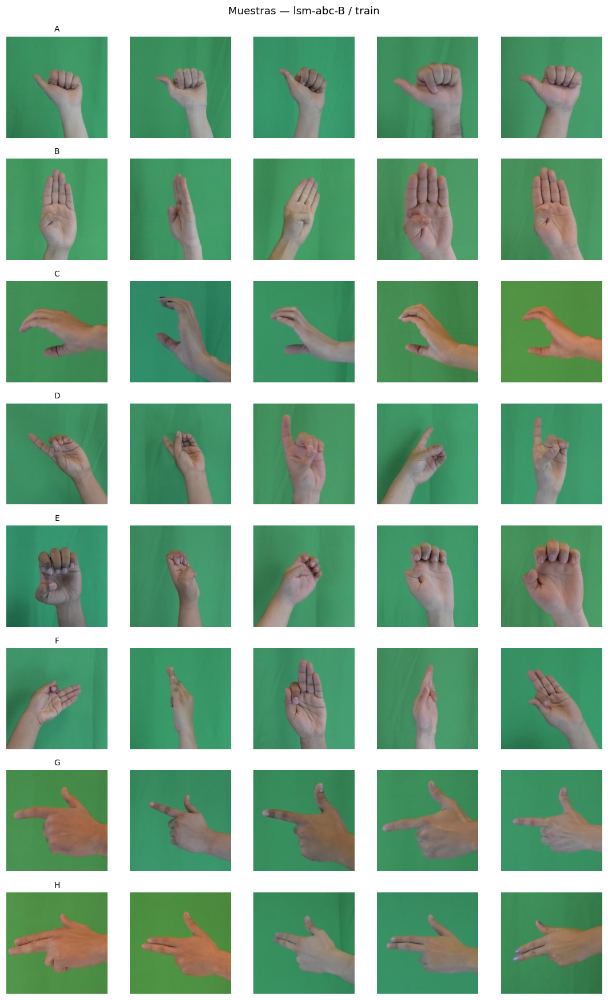

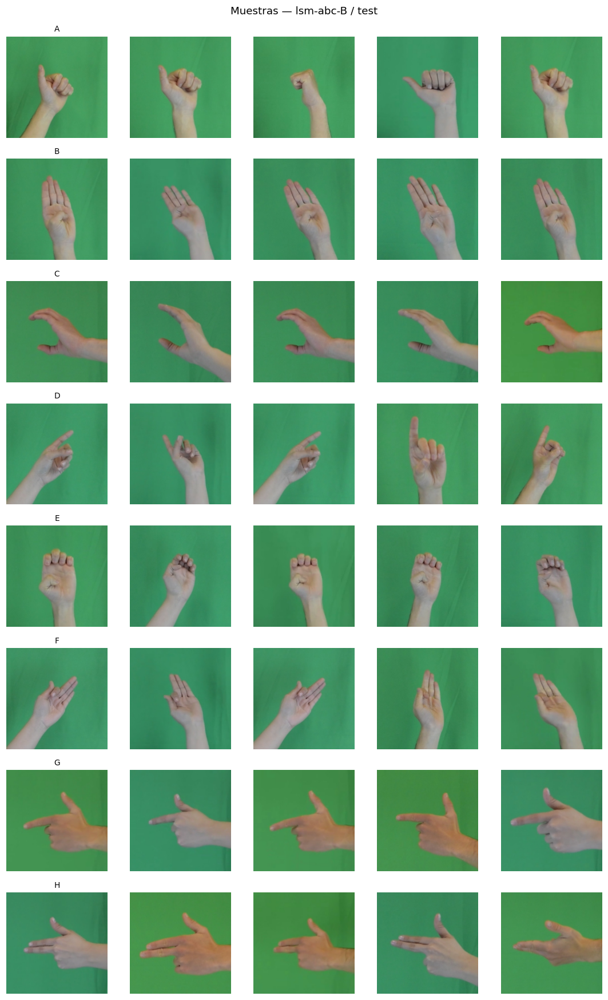

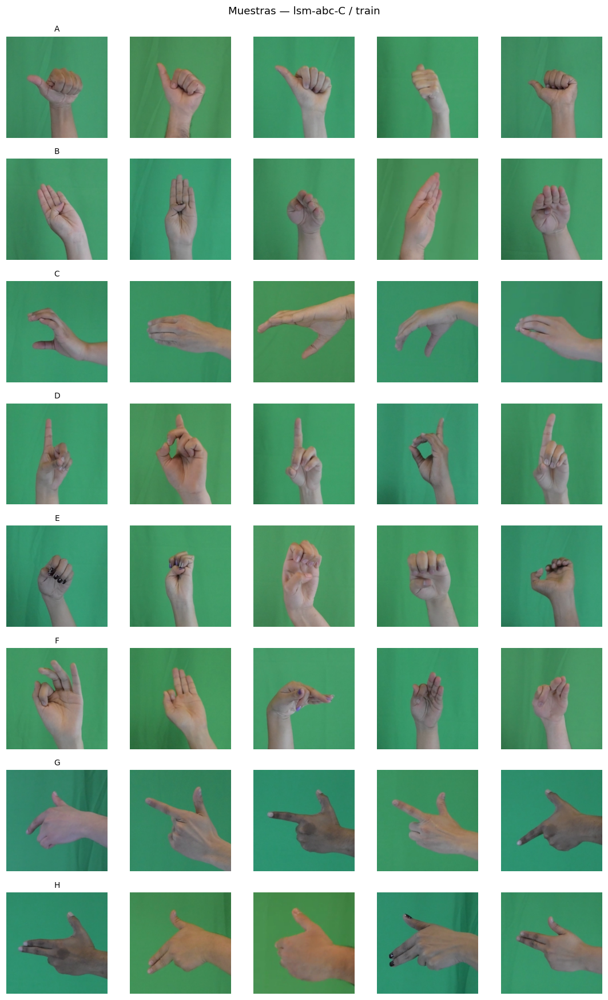

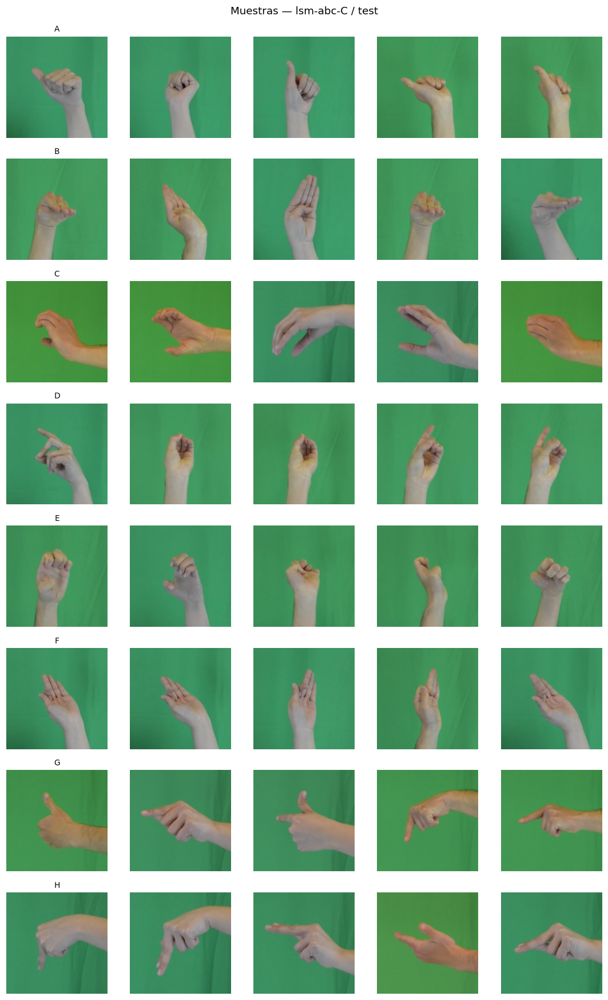

In [6]:
# ╔════════════════════════════════════════════════════════════╗
# ║  Muestras visuales                                         ║
# ║  Propósito: revisar ejemplos por clase y detectar outliers.║
# ╚════════════════════════════════════════════════════════════╝

# Muestras por dataset/split
import numpy as np

def show_samples(df_, title, per_class=6, max_classes=10, seed=RNG_SEED):
    # """Muestra per_class imágenes por clase (hasta max_classes clases)."""
    labels = sorted(df_['label'].unique().tolist())[:max_classes]
    nrows = len(labels)
    ncols = per_class
    if nrows == 0:
        return
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*2.0, nrows*2.0))
    if nrows == 1:
        axes = np.array([axes])
    for r, cls in enumerate(labels):
        cls_df = df_[df_['label']==cls]
        take = min(per_class, len(cls_df))
        if take == 0:
            for c in range(ncols):
                axes[r,c].axis('off')
            continue
        samp = cls_df.sample(take, random_state=seed)
        # Si faltan imágenes para llenar columnas, repetir algunas
        if take < ncols:
            samp = pd.concat([samp, samp.sample(ncols-take, replace=True, random_state=seed)])
        for c, (_, row) in enumerate(samp.iterrows()):
            ax = axes[r,c]
            try:
                with Image.open(row['filepath']) as im:
                    ax.imshow(im)
            except Exception:
                ax.text(0.5,0.5,"Error",ha='center',va='center')
            ax.set_axis_off()
            if c == 0:
                ax.set_title(cls, fontsize=9)
    plt.suptitle(title, y=0.99)
    plt.tight_layout()
    plt.show()

for d in sorted(ok_df['dataset'].unique()):
    for sp in ["train","test"]:
        sub = ok_df[(ok_df['dataset']==d) & (ok_df['split']==sp)]
        show_samples(sub, title=f"Muestras — {d} / {sp}", per_class=5, max_classes=8)

In [7]:
# ╔════════════════════════════════════════════════════════════╗
# ║  Duplicados (pHash) globales                               ║
# ║  Propósito: detectar imágenes idénticas o casi idénticas.  ║
# ╚════════════════════════════════════════════════════════════╝

# Duplicados (pHash) globales: detecta duplicados incluso entre datasets
def phash_df(df_, hash_size=16):
    # """Calcula pHash por imagen y devuelve DF con columnas base + 'phash'."""
    rows = []
    if not _HAS_IMAGEHASH:
        print("imagehash no está instalado. Instala con: pip install imagehash")
        return pd.DataFrame(columns=['filepath','dataset','split','label','phash'])
    for _, r in tqdm(df_.iterrows(), total=len(df_), desc="pHash global"):
        try:
            with Image.open(r['filepath']) as im:
                im = ImageOps.exif_transpose(im).convert('RGB')
                ph = imagehash.phash(im, hash_size=hash_size)
                rows.append({'filepath': r['filepath'], 'dataset': r['dataset'],
                             'split': r['split'], 'label': r['label'], 'phash': str(ph)})
        except Exception:
            continue
    return pd.DataFrame(rows)

hdf = phash_df(ok_df)
dups = []
if len(hdf):
    for ph, g in hdf.groupby('phash'):
        if len(g) > 1:
            dups.append(g)
dup_df = pd.concat(dups, ignore_index=True) if dups else pd.DataFrame(columns=hdf.columns)

# Guardar candidatos a duplicados
dup_csv = OUT_DIR / "duplicate_candidates_global.csv"
dup_df.to_csv(dup_csv, index=False)

print("Candidatos a duplicados:", len(dup_df))
dup_csv, dup_df.head(20)


pHash global: 100%|███████████████████████████████████████████████████████████| 279716/279716 [13:18<00:00, 350.36it/s]


Candidatos a duplicados: 2007


(WindowsPath('C:/Users/yohan/Pictures/LSM datasets/LSM Static - Zenodo/MSL-ABC/_eda_multi_outputs/duplicate_candidates_global.csv'),
                                              filepath    dataset  split label  \
 0   C:\Users\yohan\Pictures\LSM datasets\LSM Stati...  lsm-abc-A  train     V   
 1   C:\Users\yohan\Pictures\LSM datasets\LSM Stati...  lsm-abc-A  train     V   
 2   C:\Users\yohan\Pictures\LSM datasets\LSM Stati...  lsm-abc-B  train     W   
 3   C:\Users\yohan\Pictures\LSM datasets\LSM Stati...  lsm-abc-B  train     W   
 4   C:\Users\yohan\Pictures\LSM datasets\LSM Stati...  lsm-abc-B  train     U   
 5   C:\Users\yohan\Pictures\LSM datasets\LSM Stati...  lsm-abc-B  train     U   
 6   C:\Users\yohan\Pictures\LSM datasets\LSM Stati...  lsm-abc-B  train     U   
 7   C:\Users\yohan\Pictures\LSM datasets\LSM Stati...  lsm-abc-B  train     L   
 8   C:\Users\yohan\Pictures\LSM datasets\LSM Stati...  lsm-abc-B  train     L   
 9   C:\Users\yohan\Pictures\LSM datasets\LSM S

In [8]:
# ╔════════════════════════════════════════════════════════════╗
# ║  Exportación de resultados                                 ║
# ║  Propósito: CSVs por dataset y consolidado para modelado.  ║
# ╚════════════════════════════════════════════════════════════╝

# Consolidado (solo imágenes válidas)
consolidated_csv = OUT_DIR / "consolidated_ok.csv"
ok_df.to_csv(consolidated_csv, index=False)

# Uno por dataset
by_dataset = {}
for d in sorted(ok_df['dataset'].unique()):
    path = OUT_DIR / f"{d}_ok.csv"
    ok_df[ok_df['dataset']==d].to_csv(path, index=False)
    by_dataset[d] = path

consolidated_csv, by_dataset

(WindowsPath('C:/Users/yohan/Pictures/LSM datasets/LSM Static - Zenodo/MSL-ABC/_eda_multi_outputs/consolidated_ok.csv'),
 {'lsm-abc-A': WindowsPath('C:/Users/yohan/Pictures/LSM datasets/LSM Static - Zenodo/MSL-ABC/_eda_multi_outputs/lsm-abc-A_ok.csv'),
  'lsm-abc-B': WindowsPath('C:/Users/yohan/Pictures/LSM datasets/LSM Static - Zenodo/MSL-ABC/_eda_multi_outputs/lsm-abc-B_ok.csv'),
  'lsm-abc-C': WindowsPath('C:/Users/yohan/Pictures/LSM datasets/LSM Static - Zenodo/MSL-ABC/_eda_multi_outputs/lsm-abc-C_ok.csv')})

In [9]:
# ╔════════════════════════════════════════════════════════════╗
# ║  Resumen automático del EDA (métricas y conclusiones)      ║
# ║  Propósito: sintetizar números clave y recomendaciones.     ║
# ╚════════════════════════════════════════════════════════════╝
import numpy as np
import pandas as pd
from textwrap import dedent

# Verificaciones mínimas
assert 'df_meta' in globals(), "df_meta no encontrado. Ejecuta primero la celda de integridad/metadatos."
assert 'OUT_DIR' in globals(), "OUT_DIR no encontrado. Ejecuta la celda de configuración de rutas."

# Consolidado de válidas
ok_df = df_meta[df_meta['ok']].copy()
total = len(df_meta)
ok = len(ok_df)
bad = total - ok
pct_bad = (100.0 * bad / total) if total else 0.0

# Conteos por dataset/split/label
counts = (ok_df.groupby(['dataset','split','label'])['filepath']
          .count().rename('count').reset_index())

# Totales por dataset (válidas)
totals_by_dataset = ok_df.groupby('dataset')['filepath'].count().sort_values(ascending=False)

# Conteos globales por clase (válidas)
overall_class = ok_df.groupby('label')['filepath'].count().sort_values()
minor = overall_class.head(min(5, len(overall_class)))  # 5 más pequeñas
major = overall_class.tail(min(5, len(overall_class)))  # 5 más grandes

# Métricas de desbalance
def gini_from_counts(s: pd.Series) -> float:
    if len(s) == 0:
        return float('nan')
    x = s.values.astype(float)
    if x.sum() <= 0:
        return float('nan')
    x_sorted = np.sort(x)
    n = len(x_sorted)
    cumx = np.cumsum(x_sorted)
    # Fórmula Gini basada en Lorenz
    gini = 1.0 - 2.0 * np.sum(cumx) / (n * x_sorted.sum()) + 1.0 / n
    return float(gini)

imb_ratio = (overall_class.max() / overall_class.min()) if len(overall_class) and overall_class.min() > 0 else float('nan')
gini_overall = gini_from_counts(overall_class)

# Duplicados (si existe dup_df o hdf)
dup_candidates = pd.DataFrame()
if 'dup_df' in globals() and isinstance(dup_df, pd.DataFrame) and len(dup_df) > 0:
    dup_candidates = dup_df.copy()
elif 'hdf' in globals() and isinstance(hdf, pd.DataFrame) and 'phash' in hdf.columns:
    dups = []
    for ph, g in hdf.groupby('phash'):
        if len(g) > 1:
            dups.append(g)
    dup_candidates = pd.concat(dups, ignore_index=True) if dups else pd.DataFrame(columns=hdf.columns)

dup_total_groups = 0
dup_total_images = 0
dup_by_dataset = {}
if len(dup_candidates) > 0:
    grp = dup_candidates.groupby('phash')
    dup_total_groups = sum(1 for _, g in grp if len(g) > 1)
    dup_total_images = len(dup_candidates)
    dup_by_dataset = dup_candidates['dataset'].value_counts().to_dict()

# Tamaño “objetivo” sugerido (medianas)
w_med = int(ok_df['width'].median()) if len(ok_df) else None
h_med = int(ok_df['height'].median()) if len(ok_df) else None

# Construcción del reporte Markdown
lines = []
lines.append("## Resumen automático del EDA\n")
lines.append(f"- Imágenes totales: **{total:,}**")
lines.append(f"- Imágenes válidas: **{ok:,}**  | corruptas/ilegibles: **{bad:,}** ({pct_bad:.2f}%)\n")

lines.append("**Top datasets por tamaño (válidas):**")
for d, c in totals_by_dataset.items():
    lines.append(f"- {d}: {c:,}")
if len(totals_by_dataset) == 0:
    lines.append("- N/A")
lines.append("")

lines.append("**Clases minoritarias (hasta 5):** " + (", ".join([f"{k} ({v})" for k, v in minor.items()]) if len(minor) else "N/A"))
lines.append("**Clases mayoritarias (hasta 5):** " + (", ".join([f"{k} ({v})" for k, v in major.sort_values(ascending=False).items()]) if len(major) else "N/A"))
lines.append(f"**Desbalance global (max/min):** {imb_ratio:.2f}" if np.isfinite(imb_ratio) else "**Desbalance global (max/min):** N/A")
lines.append(f"**Índice Gini (distribución de clases):** {gini_overall:.3f}" if np.isfinite(gini_overall) else "**Índice Gini (distribución de clases):** N/A")
lines.append("")

if dup_total_images > 0:
    lines.append(f"**Duplicados (pHash):** {dup_total_images} imágenes en {dup_total_groups} grupos.")
    if dup_by_dataset:
        lines.append("**Duplicados por dataset:** " + ", ".join([f"{k}: {v}" for k, v in dup_by_dataset.items()]))
    lines.append("→ Revisa `duplicate_candidates_global.csv` para detalles.")
else:
    lines.append("**Duplicados (pHash):** No se detectaron candidatos o no se ejecutó la celda de pHash.")
lines.append("")

lines.append("**Sugerencias automáticas:**")
if np.isfinite(imb_ratio) and imb_ratio > 1.5:
    lines.append("- Considera `class_weight` o remuestreo (oversampling/augmentations) para clases minoritarias.")
if pct_bad > 0:
    lines.append("- Depura archivos corruptos/ilegibles (ver `master_multi.csv`).")
if w_med and h_med:
    lines.append(f"- Un tamaño objetivo razonable para entrenamiento podría ser **{w_med}×{h_med}** (o 224×224 como estándar).")
lines.append("- Documenta normalización (media/std), fija semillas y evita fugas entre splits.")
lines.append("")

report_md = "\n".join(lines)

# Guardar a archivo Markdown
out_md = OUT_DIR / "auto_conclusiones.md"
with open(out_md, "w", encoding="utf-8") as f:
    f.write(report_md)

# Mostrar en salida del notebook
try:
    from IPython.display import Markdown, display
    display(Markdown(report_md))
except Exception:
    print(report_md)

print(f"\nGuardado en: {out_md}")


## Resumen automático del EDA

- Imágenes totales: **279,716**
- Imágenes válidas: **279,716**  | corruptas/ilegibles: **0** (0.00%)

**Top datasets por tamaño (válidas):**
- lsm-abc-C: 94,153
- lsm-abc-B: 92,860
- lsm-abc-A: 92,703

**Clases minoritarias (hasta 5):** N (12286), H (12469), V (13076), Y (13146), U (13160)
**Clases mayoritarias (hasta 5):** A (13898), B (13756), E (13753), I (13680), F (13637)
**Desbalance global (max/min):** 1.13
**Índice Gini (distribución de clases):** 0.015

**Duplicados (pHash):** 2007 imágenes en 921 grupos.
**Duplicados por dataset:** lsm-abc-B: 1731, lsm-abc-A: 249, lsm-abc-C: 27
→ Revisa `duplicate_candidates_global.csv` para detalles.

**Sugerencias automáticas:**
- Un tamaño objetivo razonable para entrenamiento podría ser **360×360** (o 224×224 como estándar).
- Documenta normalización (media/std), fija semillas y evita fugas entre splits.



Guardado en: C:\Users\yohan\Pictures\LSM datasets\LSM Static - Zenodo\MSL-ABC\_eda_multi_outputs\auto_conclusiones.md
